<a href="https://colab.research.google.com/github/ryali93/pucp_dl_objectdetection/blob/master/own_yolo_UAV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Proyecto del curso [YOLOv5 con datos UAV] 

Configurando el directorio de trabajo

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
%cd drive/MyDrive/ciclo_02/deep_learning/own_yolo_UAV/

/content/drive/MyDrive/ciclo_02/deep_learning/own_yolo_UAV


## Prerequisitos

Configurando la memoria GPU

In [2]:
!nvidia-smi

Thu Dec 17 19:11:57 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.45.01    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P8    10W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Instalación de librerías requeridas para poder correr con YOLOv5

In [3]:
!sudo apt-get install tree -qq > /dev/null
!sudo apt-get install tree

Reading package lists... Done
Building dependency tree       
Reading state information... Done
tree is already the newest version (1.7.0-5).
0 upgraded, 0 newly installed, 0 to remove and 14 not upgraded.


In [4]:
!pip install torch==1.5.1+cu101 torchvision==0.6.1+cu101 -f https://download.pytorch.org/whl/torch_stable.html
!pip install numpy==1.17
!pip install PyYAML==5.3.1
!pip install git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI

Looking in links: https://download.pytorch.org/whl/torch_stable.html
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-lwc8d2w4
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-lwc8d2w4
  Created wheel for pycocotools: filename=pycocotools-2.0-cp36-cp36m-linux_x86_64.whl size=266455 sha256=2fd4d0ac40f5b79e6e7e9d06855fea6b436ed962e7a9edd66fc559c2a376ac64
  Stored in directory: /tmp/pip-ephem-wheel-cache-qlemu737/wheels/90/51/41/646daf401c3bc408ff10de34ec76587a9b3ebfac8d21ca5c3a
Successfully built pycocotools


También instalaremos NVIDIA Apex para aumentar la velocidad de entranamiento de nuestro modelo. Este paso es opcional

In [5]:
!git clone https://github.com/NVIDIA/apex && cd apex && pip install -v --no-cache-dir --global-option="--cpp_ext" --global-option="--cuda_ext" . --user && cd .. && rm -rf apex

Cloning into 'apex'...
remote: Enumerating objects: 37, done.
remote: Counting objects: 100% (37/37), done.
remote: Compressing objects: 100% (37/37), done.
remote: Total 7872 (delta 10), reused 7 (delta 0), pack-reused 7835
Receiving objects: 100% (7872/7872), 13.99 MiB | 9.72 MiB/s, done.
Resolving deltas: 100% (5357/5357), done.
Checking out files: 100% (295/295), done.
/usr/local/lib/python3.6/dist-packages/pip/_internal/commands/install.py:283: UserWarning: Disabling all use of wheels due to the use of --build-options / --global-options / --install-options.
  cmdoptions.check_install_build_global(options)
Created temporary directory: /tmp/pip-ephem-wheel-cache-3mk2ft_3
Created temporary directory: /tmp/pip-req-tracker-7lor8o6i
Created requirements tracker '/tmp/pip-req-tracker-7lor8o6i'
Created temporary directory: /tmp/pip-install-gmhb26rb
Processing /content/drive/MyDrive/ciclo_02/deep_learning/own_yolo_UAV/apex
  Created temporary directory: /tmp/pip-req-build-u3rc3ucr
  Added 

# Dataset existente

## Creando Dataset

Para este caso, se ha tomado como ejemplo el dataset de ropas, el cual puede ser descargado desde el siguiente [link](https://www.kaggle.com/dataturks/clothing-item-detection-for-ecommerce) de kaggle.

Este dataset contiene imagenes respectivamente etiquetadas para imágenes de polos, chaquetas, lentes, vestidos, entre otros. 

In [6]:
!gdown --id 1uWdQ2kn25RSQITtBHa9_zayplm27IXNC

Downloading...
From: https://drive.google.com/uc?id=1uWdQ2kn25RSQITtBHa9_zayplm27IXNC
To: /content/drive/MyDrive/ciclo_02/deep_learning/own_yolo_UAV/clothing.json
100% 199k/199k [00:00<00:00, 6.44MB/s]


El dataset contiene un sólo archivo JSON con las URLs de todas las imágenes y sus bounding box.

A continuación se importan todas las librerías a utilizar en el modelo.

In [7]:
from pathlib import Path
from tqdm import tqdm
import numpy as np
import json
import urllib
import PIL.Image as Image
import cv2
import torch
import torchvision
from IPython.display import display
from sklearn.model_selection import train_test_split

from sklearn.model_selection import train_test_split
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc

%matplotlib inline
%config InlineBackend.figure_format='retina'
sns.set(style='whitegrid', palette='muted', font_scale=1.2)
rcParams['figure.figsize'] = 16, 10
np.random.seed(42)

Cada línea continene un objeto JSON que contiene las coordenadas, la url de la imagen y la clase de la imagen

In [8]:
clothing = []
with open("clothing.json") as f:
  for line in f:
    clothing.append(json.loads(line))

In [9]:
for c in clothing:
  if len(c["annotation"]) > 1:
    display(c)

{'annotation': [{'imageHeight': 312,
   'imageWidth': 265,
   'label': ['Jackets'],
   'notes': '',
   'points': [{'x': 0, 'y': 0.6185897435897436},
    {'x': 0.026415094339622643, 'y': 0.6185897435897436}]},
  {'imageHeight': 312,
   'imageWidth': 265,
   'label': ['Skirts'],
   'notes': '',
   'points': [{'x': 0.01509433962264151, 'y': 0.03205128205128205},
    {'x': 1, 'y': 0.9839743589743589}]}],
 'content': 'http://com.dataturks.a96-i23.open.s3.amazonaws.com/2c9fafb063ad2b650163b00a1ead0017/b3be330c-c211-45bb-b244-11aef08021c8___Data_free-sk-5108-mudrika-original-imaf4fz626pegq9f.jpeg',
 'extras': None}

Aquí podemos ver la lista de todas las categorías que se encuentran en el dataset.

In [10]:
categories = []

for c in clothing:
  for a in c["annotation"]:
    categories.extend(a["label"])

categories = list(set(categories))
categories

['Jackets',
 'Jeans',
 'Tops',
 'Trousers',
 'Shirts',
 'Shoes',
 'Skirts',
 'sunglasses',
 'Tshirts']

## Dividiendo el dataset

Tenemos 9 categorías para este dataset y la estamos separando en 90% para entrenamiento y 10% para validación.

In [11]:
train_clothing, val_clothing = train_test_split(clothing, test_size=0.1)

In [12]:
len(train_clothing), len(val_clothing)

(453, 51)

Aquí podemos observar un ejemplo de una imagen

In [13]:
row = train_clothing[0]

img = urllib.request.urlopen(row["content"])
img = Image.open(img)
img = img.convert("RGB")

img.save("demo_image.jpeg", "JPEG")

In [14]:
row

{'annotation': [{'imageHeight': 312,
   'imageWidth': 216,
   'label': ['Skirts'],
   'notes': '',
   'points': [{'x': 0.07407407407407407, 'y': 0.09294871794871795},
    {'x': 0.9768518518518519, 'y': 0.9935897435897436}]}],
 'content': 'http://com.dataturks.a96-i23.open.s3.amazonaws.com/2c9fafb063ad2b650163b00a1ead0017/f1de52ad-e4fb-4058-be8a-8c417b6e7791___Data_dl3208-decot-paradise-free-original-imaenr8farngveuu.jpeg',
 'extras': None}

Utilizamos OpenCv por su facilidad para trabajar con imágenes

In [15]:
img = cv2.cvtColor(cv2.imread("demo_image.jpeg"), cv2.COLOR_BGR2RGB)

In [16]:
img.shape

(312, 216, 3)

## Configuración del bounding box

In [17]:
for a in row["annotation"]:
  for label in a["label"]:
    
    w = a["imageWidth"]
    h = a["imageHeight"]

    points = a["points"]
    p1, p2 = points

    x1, y1 = p1["x"] * w, p1["y"] * h
    x2, y2 = p2["x"] * w, p2["y"] * h

    cv2.rectangle(
        img,
        (int(x1), int(y1)),
        (int(x2), int(y2)),
        color=(0, 255, 0),
        thickness=2
    )

    ((label_width, label_height), _) = cv2.getTextSize(
        label,
        fontFace=cv2.FONT_HERSHEY_PLAIN,
        fontScale=1.75,
        thickness=2
    )
    
    cv2.rectangle(
        img,
        (int(x1), int(y1)),
        (
            int(x1 + label_width + label_width * 0.05), 
            int(y1 + label_height + label_height * 0.25)
        ),
        color=(0, 255, 0),
        thickness=cv2.FILLED
    )

    cv2.putText(
        img,
        label,
        org=(int(x1), int(y1 + label_height + label_height * 0.25)), # Punto inferior izquierdo del punto
        fontFace=cv2.FONT_HERSHEY_PLAIN,
        fontScale=1.75,
        color=(255, 255, 255),
        thickness=2
    )

Las coordenadas de los bounding box se utilizan para dibujar el rectángulos sobre la imagen.



(-0.5, 215.5, 311.5, -0.5)

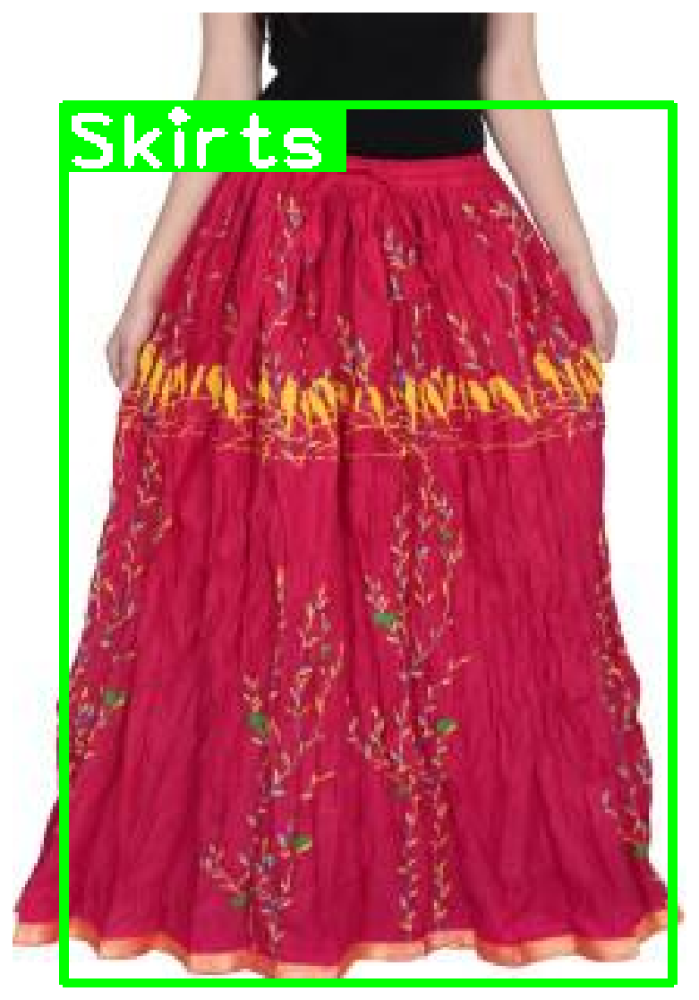

In [18]:
plt.imshow(img)
plt.axis("off")

## Convertir a formato YOLO

YOLOv5 requiere que el conjunto de datos esté en formato darknet. A continuación, se muestra un resumen de cómo se ve:

- Un txt con archivo de etiquetas por imagen
- Una fila por objeto
- Cada fila contiene: **class_index bbox_x_center bbox_y_center bbox_width bbox_height**

Las coordenadas de la caja deben estar normalizadas entre 0 y 1.

Para tener el dataset se ha creado una función auxiliar que construya un conjunto de datos en el formato correcto para poder emplear el modelo

In [19]:
import pandas as pd

In [20]:
def create_dataset(clothing, categories, dataset_type):

  images_path = Path(f"clothing/images/{dataset_type}")
  images_path.mkdir(parents=True, exist_ok=True)

  labels_path = Path(f"clothing/labels/{dataset_type}")
  labels_path.mkdir(parents=True, exist_ok=True)

  for img_id, row in enumerate(tqdm(clothing)):

    image_name = f"{img_id}.jpeg"

    img = urllib.request.urlopen(row["content"])
    img = Image.open(img)
    img = img.convert("RGB")

    img.save(str(images_path / image_name), "JPEG")

    label_name = f"{img_id}.txt"

    with (labels_path / label_name).open(mode="w") as label_file:
      
      for a in row["annotation"]:

        for label in a["label"]:

          category_idx = categories.index(label)

          points = a["points"]
          p1, p2 = points

          x1, y1 = p1["x"], p1["y"]
          x2, y2 = p2["x"], p2["y"]

          bbox_width = x2 - x1
          bbox_height = y2 - y1
          
          label_file.write(
              f"{category_idx} {x1 + bbox_width / 2} {y1 + bbox_height / 2} {bbox_width} {bbox_height}\n"
          )

In [21]:
create_dataset(train_clothing, categories, "train")
create_dataset(val_clothing, categories, "val")

100%|██████████| 51/51 [00:03<00:00, 14.91it/s]


In [22]:
!tree clothing -L 2

clothing
├── images
│   ├── train
│   └── val
└── labels
    ├── train
    └── val

6 directories, 0 files


In [23]:
# %rm -rf clothing

Un ejemplo de cómo se encuentra el labeling de una imagen

In [24]:
!cat clothing/labels/train/0.txt

6 0.525462962962963 0.5432692307692308 0.9027777777777778 0.9006410256410257


## Implementación del modelo YOLO v5

El modelo YOLO, cuyo primer artículo se encuentra en el siguiente [link](https://arxiv.org/abs/1506.02640) ha sufrido algunas mejoras hasta llegar a su versión actual (versión 5), que se basa en la librería de Redes Neuronales [Darknet](https://pjreddie.com/darknet/).

Este modelo emplea Pytorch, pero ya se encuentra armado para ser empleado. Para esto se ha descargado el modelo desde su repositorio en [github](https://github.com/ultralytics/yolov5).

In [ ]:
# !git clone https://github.com/ultralytics/yolov5
%cd yolov5
!git reset --hard 5e970d4 
# !git checkout ec72eea62bf5bb86b0272f2e65e413957533507f
# !git checkout 2268f9c44fc8d04e7c6b062bceb128befb555ef0

In [50]:
!gdown --id 14MoJTr5WMyWhk7a6twL3TZMhwWxSp8D1 -O data/config_uav.yaml
!gdown --id 1o44xGk6BL2gzxzF-bZb7aOLbq_noz4-u -O models/config_yolov5x_uav.yaml

Downloading...
From: https://drive.google.com/uc?id=14MoJTr5WMyWhk7a6twL3TZMhwWxSp8D1
To: /content/drive/My Drive/ciclo_02/deep_learning/own_yolo_UAV/yolov5/data/config_uav.yaml
100% 128/128 [00:00<00:00, 221kB/s]
Downloading...
From: https://drive.google.com/uc?id=1o44xGk6BL2gzxzF-bZb7aOLbq_noz4-u
To: /content/drive/My Drive/ciclo_02/deep_learning/own_yolo_UAV/yolov5/models/config_yolov5x_uav.yaml
100% 1.63k/1.63k [00:00<00:00, 6.26MB/s]


Ajustar un modelo existente no es muy complicado. Para este ejemplo usaremos el modelo más grande YOLOv5x (con 89M de parámetros), que también es el más preciso.

Para entrenar un modelo en un conjunto de datos personalizado, llamaremos al script train.py.

- img 608: cambia el tamaño de las imágenes a 608x608 píxeles
- batch 4: 4 imágenes por lote
- epochs 30: entrenar por 30 epochs
- data ./data/config_uav.yaml: ruta a la configuración del conjunto de datos
- cfg ./models/config_yolov5x_uav.yaml: configuración del modelo
- weights yolov5x.pt: utiliza pesos previamente entrenados del modelo YOLOv5x
- name yolov5x_clothing: nombre de nuestro modelo
- cache: imágenes de conjuntos de datos en caché para un entrenamiento más rápido

In [51]:
!python train.py --img 608 --batch 4 --epochs 100 \
  --data ./data/config_uav.yaml --cfg ./models/config_yolov5x_uav.yaml --weights yolov5x.pt \
  --name yolov5x_uav --cache

Using CUDA Apex device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

Namespace(batch_size=4, bucket='', cache_images=True, cfg='./models/config_yolov5x_uav.yaml', data='./data/config_uav.yaml', device='', epochs=100, evolve=False, hyp='', img_size=[608, 608], local_rank=-1, multi_scale=False, name='yolov5x_uav', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, sync_bn=False, total_batch_size=4, weights='yolov5x.pt', world_size=1)
Start Tensorboard with "tensorboard --logdir=runs", view at http://localhost:6006/
2020-12-17 20:13:06.824077: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1
Hyperparameters {'optimizer': 'SGD', 'lr0': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'giou': 0.05, 'cls': 0.58, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h': 0.014, 'hsv_s': 0.68, 'hsv_v': 0.36, 'degrees': 0.0, 'tran

La función plot_results() permite evaluar el rendimiento del modelo en la última ejecución de entrenamiento:

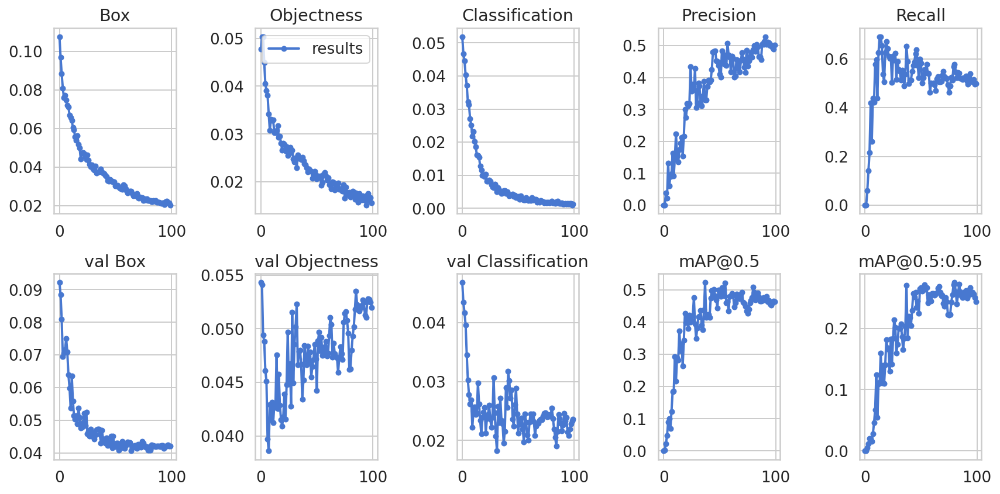

In [74]:
from utils.utils import plot_results
%cd runs/exp1_yolov5x_uav/
plot_results()

Se puede ver que la precisión media media (mAP) está mejorando a lo largo del entrenamiento. El modelo puede mejorarse aún más.

## Haciendo predicciones

Hemos escogido unas 50 imagenes del conjunto de validación para realizar predicciones con el modelo.

In [72]:
%cd ../..

/content/drive/My Drive/ciclo_02/deep_learning/own_yolo_UAV/yolov5


In [53]:
!find ../dataset/images/val/ -maxdepth 1 -type f | head -50 | xargs cp -t "./inference/images/"

Usaremos el script detect.py para ejecutar nuestro modelo en las imágenes. Estos son los parámetros que estamos usando:

- weights runs/exp1_yolov5x_uav/best_yolov5x_uav.pt: punto de control del modelo
- img 608: cambia el tamaño de las imágenes a 608x608 px
- conf 0.4: Considera las predicciones con una confianza de 0.4 o superior
- source ./inference/images/ - ruta a las imágenes

In [59]:
!python detect.py --weights runs/exp1_yolov5x_uav/weights/best_yolov5x_uav.pt \
  --img 608 --conf 0.4 --source ./inference/images/

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', img_size=608, iou_thres=0.5, output='inference/output', save_txt=False, source='./inference/images/', update=False, view_img=False, weights=['runs/exp1_yolov5x_uav/weights/best_yolov5x_uav.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

Fusing layers... Model Summary: 284 layers, 8.84108e+07 parameters, 8.45317e+07 gradients
image 1/51 /content/drive/My Drive/ciclo_02/deep_learning/own_yolo_UAV/yolov5/inference/images/mmo#1220.jpg: 608x608 1 sluices, 1 dredges, Done. (0.050s)
image 2/51 /content/drive/My Drive/ciclo_02/deep_learning/own_yolo_UAV/yolov5/inference/images/mmo#1320.jpg: 608x608 1 sluices, Done. (0.037s)
image 3/51 /content/drive/My Drive/ciclo_02/deep_learning/own_yolo_UAV/yolov5/inference/images/mmo#1336.jpg: 608x608 1 floats, 1 dredges, Done. (0.037s)
image 4/51 /content/drive/My Drive/ciclo_02/deep_learning/own_yolo_UAV/yolov5/inference/images/mmo

In [60]:
def load_image(img_path: Path, resize=True):
  img = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)
  img = cv2.resize(img, (128, 256), interpolation = cv2.INTER_AREA)
  return img
def show_grid(image_paths):
  images = [load_image(img) for img in image_paths]
  images = torch.as_tensor(images)
  images = images.permute(0, 3, 1, 2)
  grid_img = torchvision.utils.make_grid(images, nrow=11)
  plt.figure(figsize=(24, 12))
  plt.imshow(grid_img.permute(1, 2, 0))
  plt.axis('off');

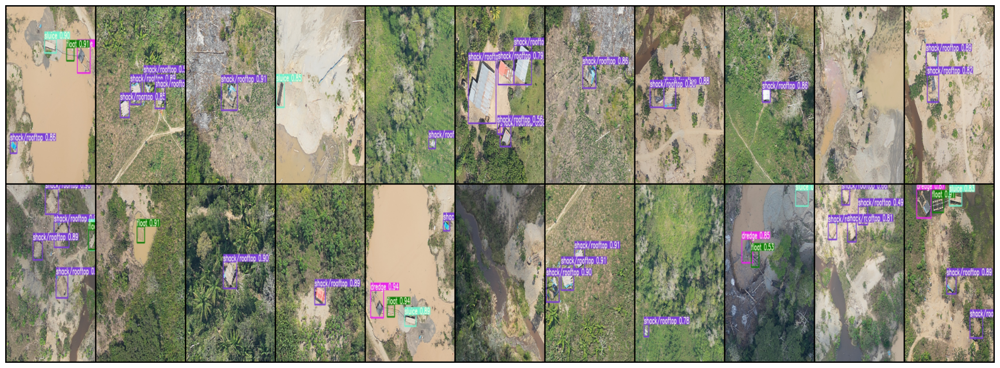

In [ ]:
img_paths = list(Path("inference/output").glob("*.jpg"))[:22]
show_grid(img_paths)

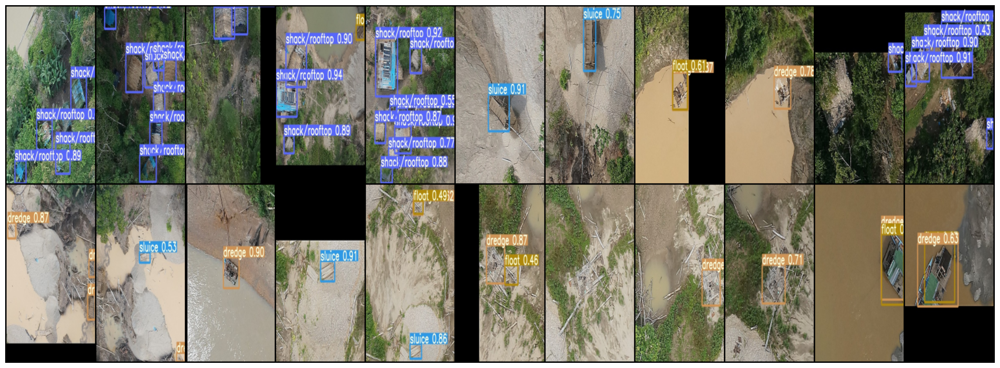

In [62]:
img_paths = list(Path("inference/output").glob("*.jpg"))[20:42]
show_grid(img_paths)

In [ ]:
img_path = 'inference/output/0#409.jpg'
img_t = cv2.cvtColor(cv2.imread(str(img_path)), cv2.COLOR_BGR2RGB)
img_t = cv2.resize(img_t, (256, 256), interpolation = cv2.INTER_AREA)

(-0.5, 255.5, 255.5, -0.5)

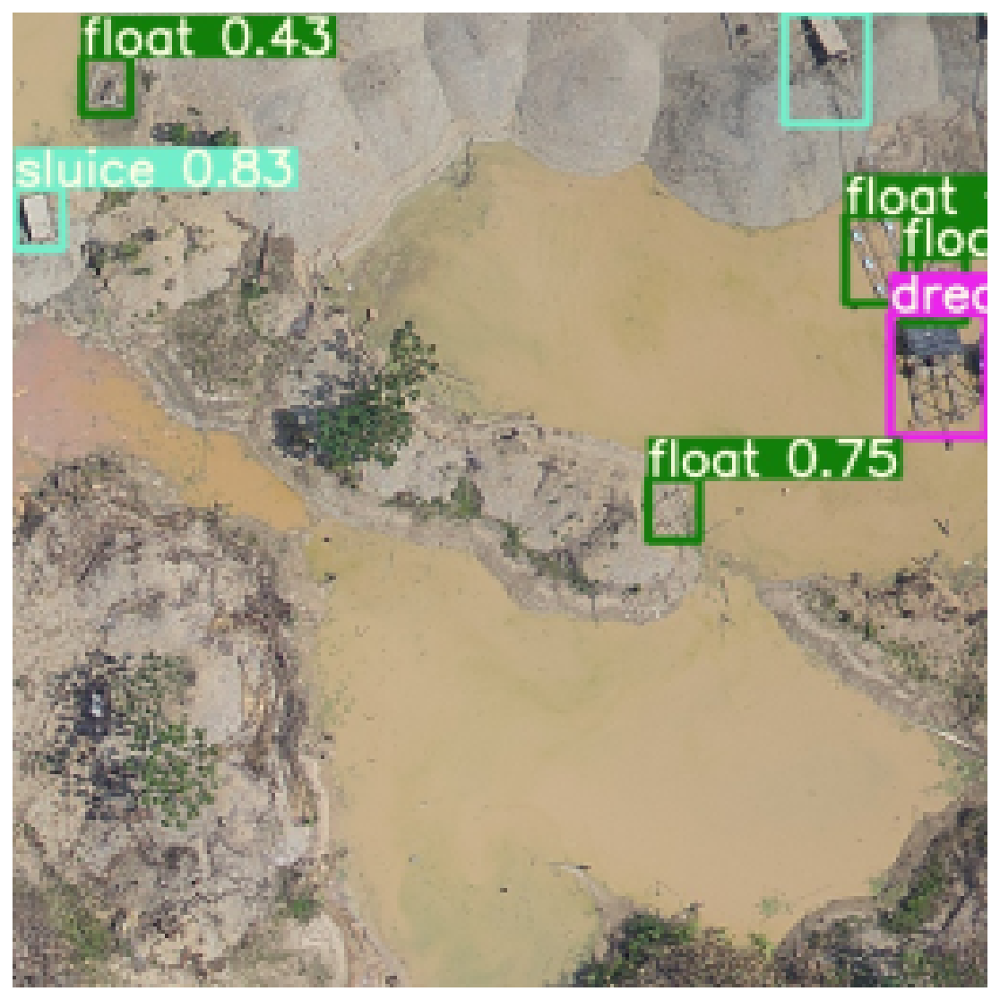

In [ ]:
plt.imshow(img_t)
plt.axis("off")